# Fitted (cross-) semivariograms and (cross-) covariograms; random months, different time lags

## Findings:


In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(0, "../src")

In [2]:
import numpy as np
import xarray as xr

import fields
import cov_model
import plot

%matplotlib inline

## Read data and setup analysis

In [3]:
ds = xr.open_dataset("../data/exp_pro/OCO2_MODIS_4x5deg_monthly_conus_augmented.nc")
ds = ds.where(ds.time.dt.year > 2014, drop=True)

# Format as multi-fields
ds_xco2 = ds[["xco2", "xco2_var"]]
ds_sif = ds[["sif", "sif_var", "evi"]]

var_names = ["xco2", "sif"]
cross_name = "xco2:sif"


In [4]:
# Analysis variables
timestamps = np.random.choice(ds.time[2:], 6)
timedeltas = [0, -1, -2]
n_bins = 30
max_dist = 1500
fast_dist = True

# param_guess = [sigma1, nu1, ell1, tau1, nu12, ell12, rho12, sigma2, nu2, ell2, tau2]
params_guess = [1.0, 1.5, 700, 0.0, 1.5, 700, -0.4, 1.0, 1.5, 700, 0.0]


In [5]:
def analyze_timestamp(timestamp, timedelta):
    # Initialize Matern model
    k1 = cov_model.Matern()
    k2 = cov_model.Matern()

    # Setup multi-field object
    mf = fields.MultiField(
        ds_xco2, ds_sif, timestamp, timedelta=timedelta, fast_dist=fast_dist
    )
    model = cov_model.BivariateMatern(mf, k1, k2)
    plot.plot_fields(mf)

    # Compute empirical variograms, then fit
    vario_res, covario_res, params_fit = model.empirical_variograms(
        params_guess, n_bins=n_bins, max_dist=max_dist,
    )
    plot.plot_variograms(vario_res, timestamp, timedelta, params=params_fit)
    # plot.plot_variograms(
    #     covario_res,
    #     timestamp,
    #     timedelta,
    #     params=params_fit,
    #     type_lab="Covariogram",
    #     scale_lab="Covariance",
    # )


Time delta: 0 months
Month: 2019-02-01T00:00:00.000000000
Month: 2017-02-01T00:00:00.000000000
Month: 2018-03-01T00:00:00.000000000
Month: 2015-07-01T00:00:00.000000000
Month: 2016-04-01T00:00:00.000000000
Month: 2015-04-01T00:00:00.000000000
Time delta: -1 months
Month: 2019-02-01T00:00:00.000000000
Month: 2017-02-01T00:00:00.000000000
Month: 2018-03-01T00:00:00.000000000
Month: 2015-07-01T00:00:00.000000000
Month: 2016-04-01T00:00:00.000000000


/Users/joshjacobson/Projects/sif-data-fusion/research/../src/plot.py:280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(


Month: 2015-04-01T00:00:00.000000000
Time delta: -2 months
Month: 2019-02-01T00:00:00.000000000
Month: 2017-02-01T00:00:00.000000000
Month: 2018-03-01T00:00:00.000000000
Month: 2015-07-01T00:00:00.000000000
Month: 2016-04-01T00:00:00.000000000
Month: 2015-04-01T00:00:00.000000000


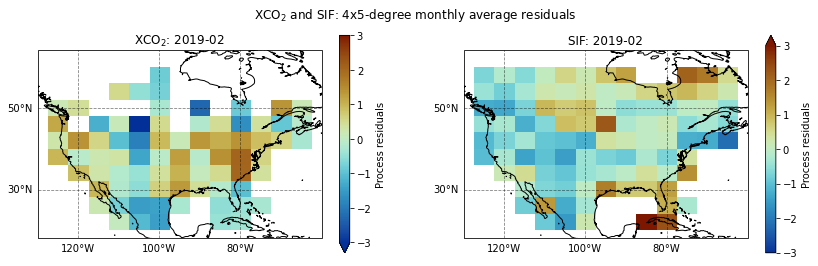

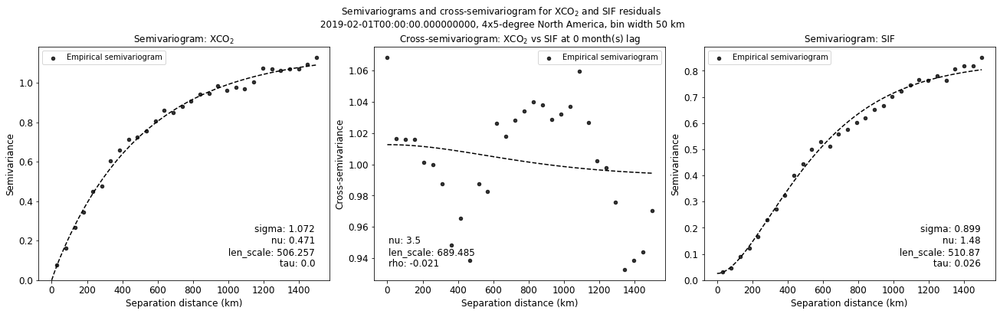

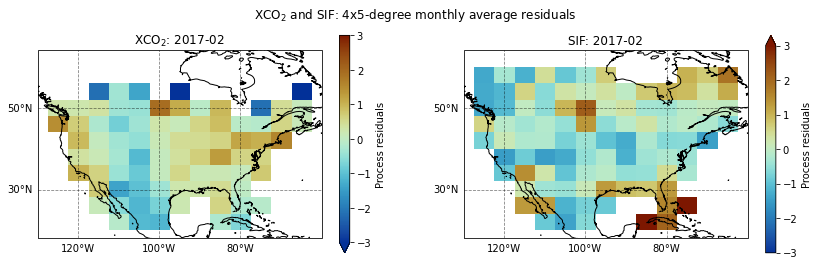

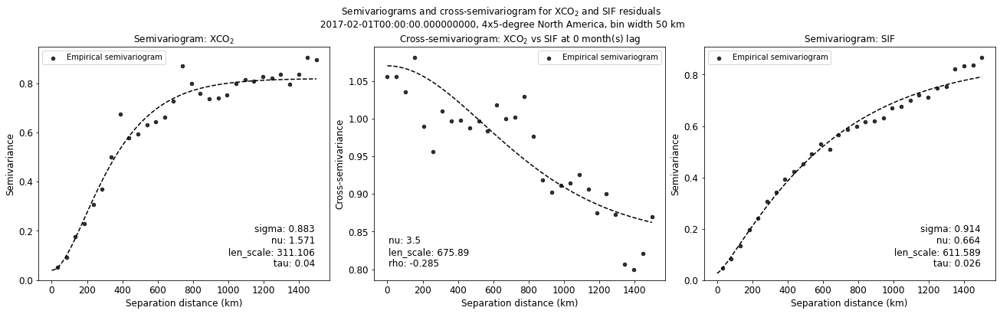

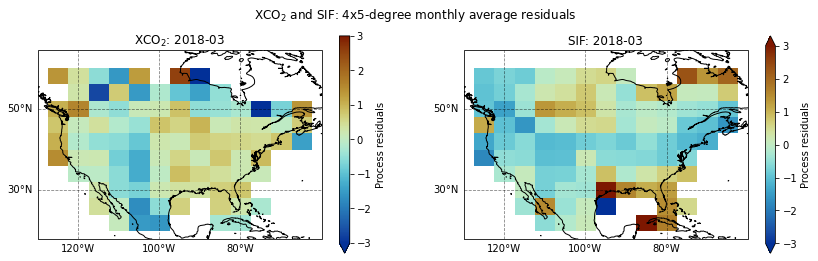

...

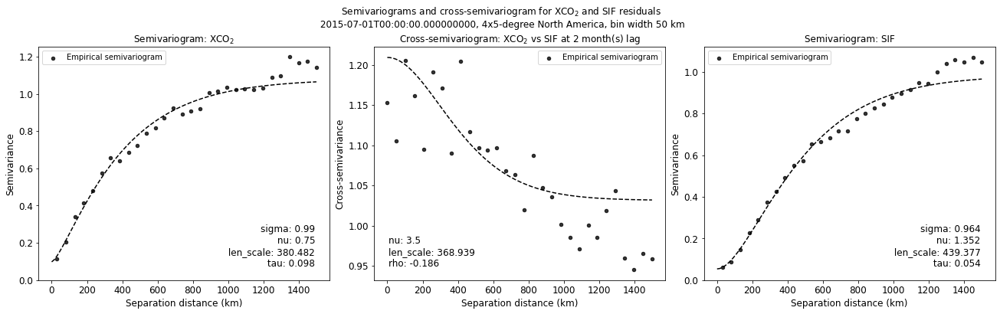

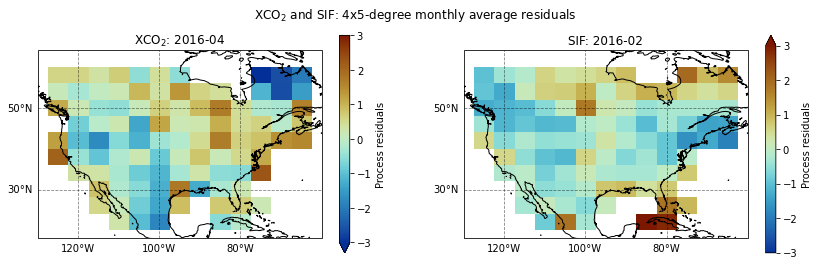

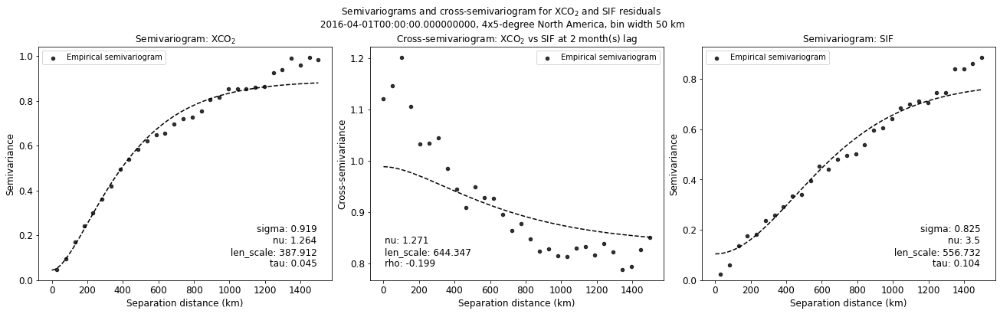

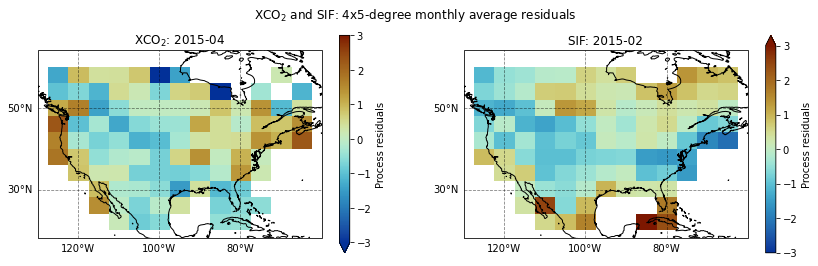

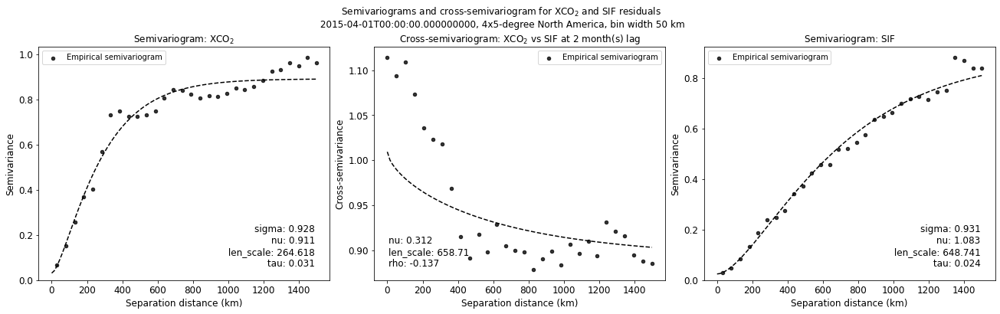

In [6]:
for delta in timedeltas:
    print(f"Time delta: {delta} months")
    for timestamp in timestamps:
        print(f"Month: {timestamp}")
        analyze_timestamp(timestamp, delta)